# Plot Gesture Scores of Metatone Data

In this notebook, I'll just plot the gesture scores of some regular Metatone data.

In [1]:
from __future__ import print_function
import os
import time
import pandas as pd
import numpy as np
import tensorflow as tf
import time
import os
import datetime
import pickle
from sklearn import datasets, metrics, cross_validation
from urllib import urlretrieve
import matplotlib.pyplot as plt
import random

URL = "https://github.com/anucc/metatone-analysis/raw/master/metadata/"
PICKLE_FILE = "metatone_performances_dataframe.pickle"

if not os.path.exists(PICKLE_FILE):
    urlretrieve(URL + PICKLE_FILE, PICKLE_FILE)

with open(PICKLE_FILE, 'rb') as f:
        metatone_dataset = pickle.load(f)
        
## Int values for Gesture codes.
NUMBER_GESTURES = 9
GESTURE_CODES = {
    'N': 0,
    'FT': 1,
    'ST': 2,
    'FS': 3,
    'FSA': 4,
    'VSS': 5,
    'BS': 6,
    'SS': 7,
    'C': 8}

## Descriptive Statistics of the dataset

Number of records: 72
Min performers: 2 Max performers: 9
Total performer-records: 252


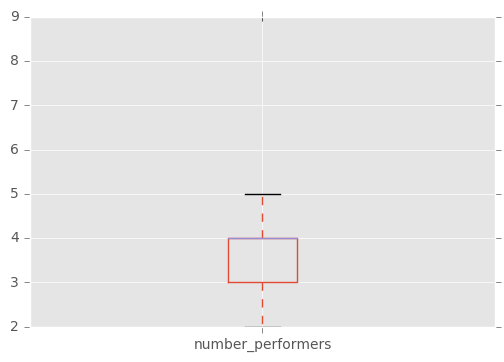

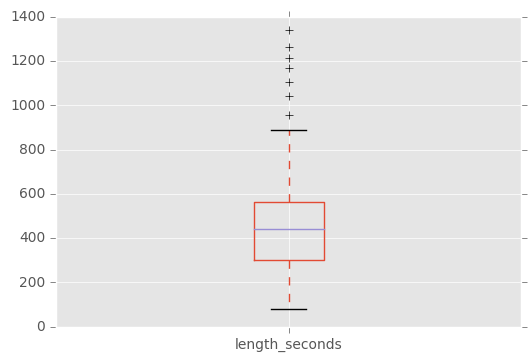

490.031380083
443.092919


In [2]:
improvisations = metatone_dataset[
    (metatone_dataset["performance_type"] == "improvisation") &
    (metatone_dataset["performance_context"] != "demonstration")]

#print(str(improvisations["performance_type"].unique()))
#print(str(improvisations["performance_context"].unique()))

print("Number of records: " + str(improvisations["number_performers"].count()))
print("Min performers: " + str(improvisations["number_performers"].min()) + " Max performers: "+ str(improvisations["number_performers"].max()))
print("Total performer-records: " + str(improvisations["number_performers"].sum()))

plt.style.use('ggplot')
performers = improvisations["number_performers"].plot(kind="box")
plt.show(performers)

length_plot = improvisations['length_seconds'].plot(kind="box")
plt.show(length_plot)
print(improvisations['length_seconds'].mean())
print(improvisations['length_seconds'].median())

In [3]:
print(improvisations.describe())

print("Total improvisation time: ", improvisations['length_seconds'].sum())

            flux  number_performers    entropy      trace  length_seconds  \
count  72.000000          72.000000  72.000000  72.000000       72.000000   
mean    0.181603           3.500000   3.581037   0.818397      490.031380   
std     0.058286           1.007018   0.568876   0.058286      282.910727   
min     0.052946           2.000000   1.928256   0.675439       79.264008   
25%     0.145838           3.000000   3.346007   0.777772      302.919864   
50%     0.183098           4.000000   3.668846   0.816902      443.092919   
75%     0.222228           4.000000   4.013487   0.854162      561.179638   
max     0.324561           9.000000   4.441664   0.947054     1340.190793   

        determinant       norm  
count  7.200000e+01  72.000000  
mean   8.002282e-12   0.400750  
std    1.321510e-11   0.098584  
min    0.000000e+00   0.275226  
25%    4.704526e-13   0.329261  
50%    3.126450e-12   0.372714  
75%    9.933159e-12   0.456582  
max    8.666851e-11   0.708394  
Total imp

In [4]:
quartets = improvisations[improvisations["number_performers"] == 4]
print(quartets.describe())
print("Total length of quartets:", quartets['length_seconds'].sum())

            flux  number_performers    entropy      trace  length_seconds  \
count  33.000000               33.0  33.000000  33.000000       33.000000   
mean    0.167293                4.0   3.575782   0.832707      576.482593   
std     0.050281                0.0   0.570931   0.050281      261.200301   
min     0.052946                4.0   1.928256   0.723818      231.813166   
25%     0.139752                4.0   3.394009   0.796875      446.019655   
50%     0.168386                4.0   3.787135   0.831614      532.231741   
75%     0.203125                4.0   3.957171   0.860248      649.122387   
max     0.276182                4.0   4.280661   0.947054     1340.190793   

        determinant       norm  
count  3.300000e+01  33.000000  
mean   7.952591e-12   0.395468  
std    9.950953e-12   0.099524  
min    5.276319e-16   0.297865  
25%    1.923111e-12   0.335124  
50%    3.527159e-12   0.353014  
75%    8.331335e-12   0.425036  
max    4.419490e-11   0.696128  
Total len

In [5]:
non_quartets = improvisations[improvisations["number_performers"] != 4]
non_quartets.describe()

,flux,number_performers,entropy,trace,length_seconds,determinant,norm
count,39.000000,39.000000,39.000000,39.000000,39.000000,3.900000e+01,39.000000
mean,0.193712,3.076923,3.585484,0.806288,416.880354,8.044328e-12,0.405219
std,0.062373,1.222263,0.574560,0.062373,283.037346,1.558553e-11,0.098859
min,0.075347,2.000000,2.057536,0.675439,79.264008,0.000000e+00,0.275226
25%,0.150927,3.000000,3.280904,0.761288,301.535422,2.404184e-13,0.318951
50%,0.194620,3.000000,3.657920,0.805380,306.748271,1.515075e-12,0.392512
75%,0.238712,3.000000,4.098295,0.849073,448.302067,9.973375e-12,0.469662
max,0.324561,9.000000,4.441664,0.924653,1264.122033,8.666851e-11,0.708394


In [6]:
a = plt.figure(figsize=(9,3),frameon=False,tight_layout=True)

axes = improvisations["number_performers"].plot(kind="hist",bins=np.linspace(1.5, 9.5, 9))
plt.xlabel("Number of Performers")
plt.savefig('number-of-performers-hist.pdf',dpi=150, format="pdf")


In [4]:
def plot_gesture_only_score(plot_title, gestures):
    """
    Plots a gesture score of gestures only - no new ideas!
    """
    idx = gestures.index
    plt.style.use('ggplot')
    # ax = plt.figure(figsize=(35,10),frameon=False,tight_layout=True).add_subplot(111)
    ax = plt.figure(figsize=(14, 4), frameon=False, tight_layout=True).add_subplot(111)
    #ax.xaxis.set_major_locator(dates.SecondLocator(bysecond=[0]))
    #ax.xaxis.set_major_formatter(dates.DateFormatter("%H:%M"))
    ax.yaxis.grid()
    plt.ylim(-0.5, 8.5)
    plt.yticks(np.arange(9), ['n', 'ft', 'st', 'fs', 'fsa', 'vss', 'bs', 'ss', 'c'])
    for n in gestures.columns:
        plt.plot(gestures.index, gestures[n], '-', label=n)
    # plt.legend(loc='upper right')
    plt.savefig(plot_title + '.pdf', dpi=150, format="pdf")
    #plt.close()
    plt.show()

# plot_gesture_only_score("metatone-real-performance-"+str(n), generated_performance)




## Plot all of the Metatone Performances

Plot the data from each Metatone Performance.

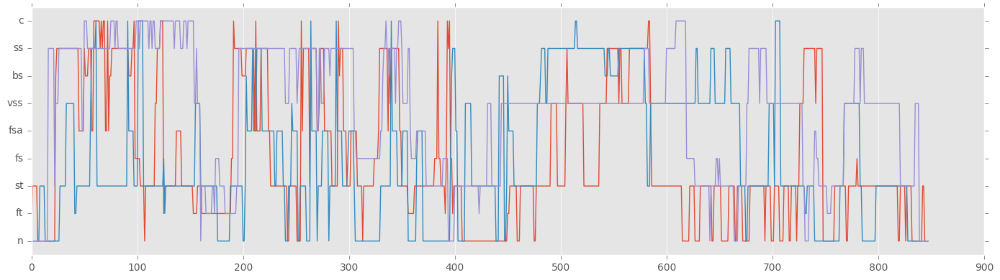

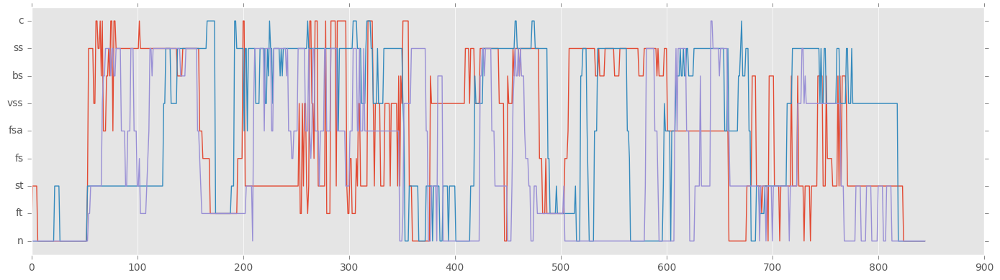

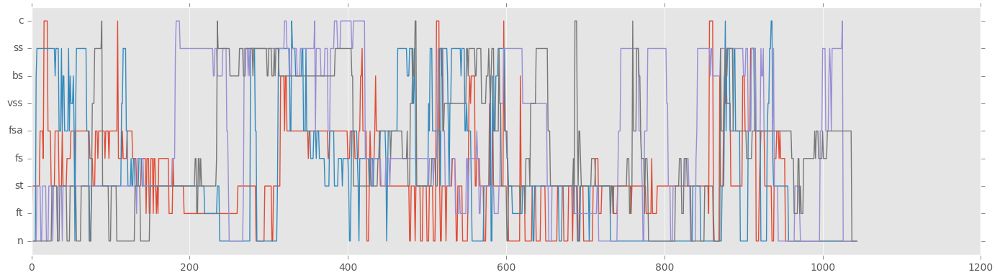

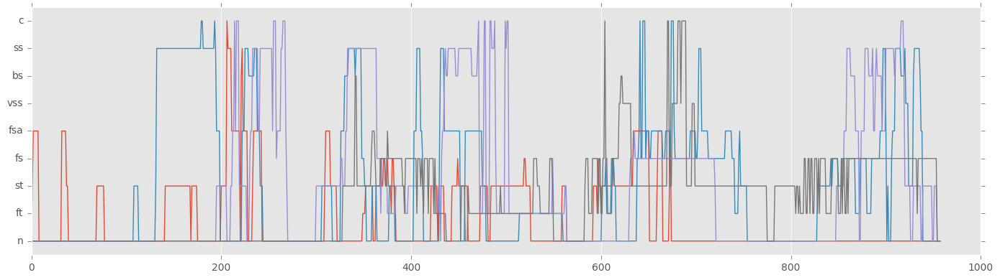

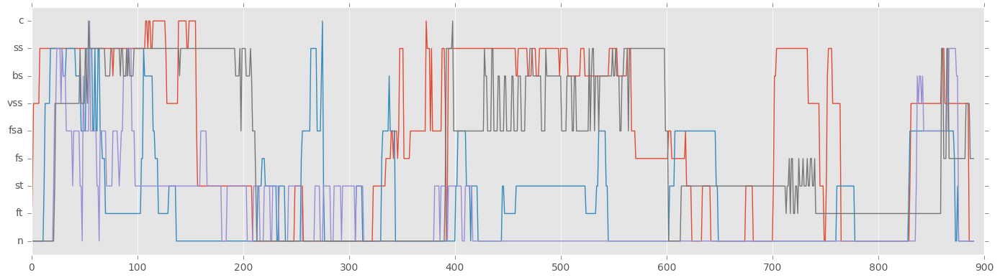

...

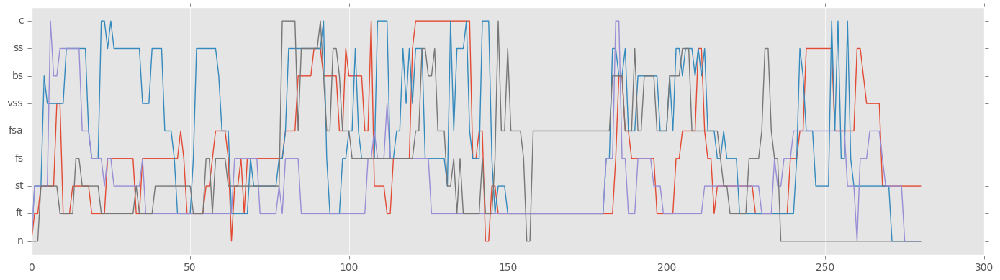

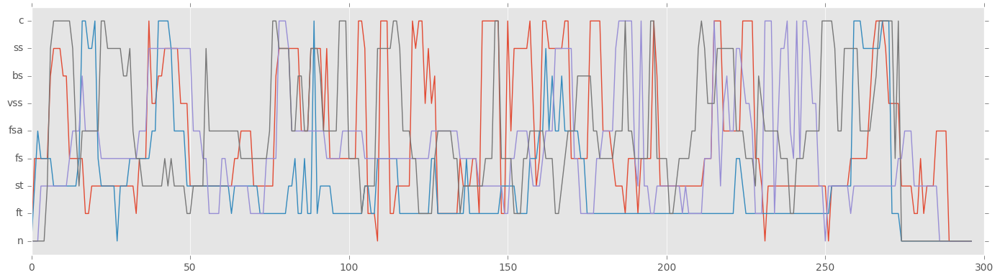

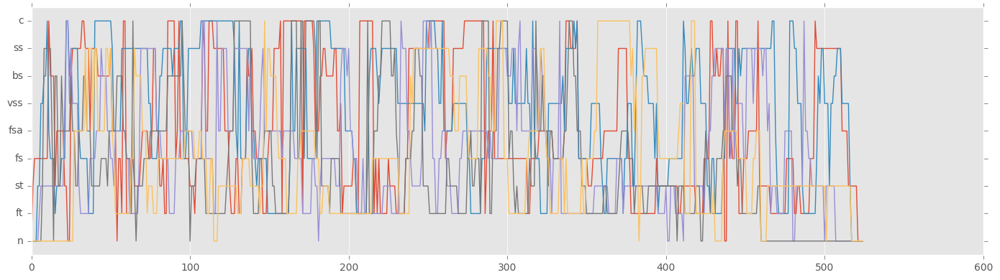

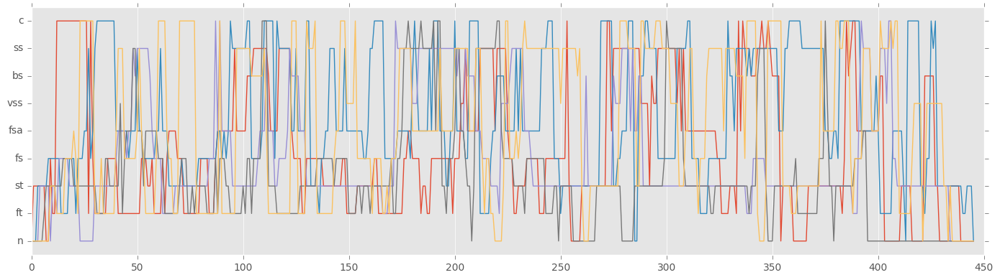

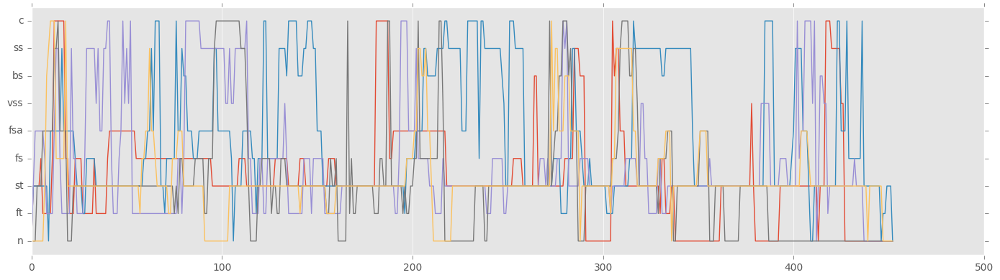

In [13]:
gesture_data = improvisations['gestures']
individual_improvisations = []

#gesture_data.ix[12]

#pd.DataFrame(gesture_data.ix[12]).plot().show()

n=12

for n, perf in enumerate(gesture_data.tolist()):
    plot_gesture_only_score("metatone-real-performance-"+str(n), pd.DataFrame(perf))


#for perf in gesture_data.tolist():
#print("Dataset contains " + str(len(individual_improvisations)) + " individual improvisations.")
#vocabulary_size = len(GESTURE_CODES)